<h2><font color="#004D7F" size=6>Clasificadores</font></h2>
<br><br>
<div style="text-align: right">
<font color="#004D7F" size=3>@IngAndresGamer </font><br>


---

<a id="section1"></a>
# <font color="#004D7F"> 1. Introducción</font>

El objetivo de hoy es revisar como calcular los descriptivos basicos con Python. 

Para poder calcularos vamos a necesitar datos, ¿Donde podemos encontrar datos para aprender y probar diferentes algoritmos? , existen varios repositorios orientados a analitica y machine learning, uno es 
https://archive.ics.uci.edu/ml/index.php

In [1]:
## Librerias
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

In [2]:
# Permite ajustar la anchura de la parte útil de la libreta (reduce los márgenes)
from IPython.core.display import display, HTML
display(HTML("<style>.container{ width:98% }</style>"))
# Elimina el Scrolling Por Defecto
from IPython.display import display, HTML
js = "<script>$('.output_scroll').removeClass('output_scroll')</script>"
display(HTML(js))

<a id="section11"></a>
## <font color="#004D7F">1.1. Cargar el conjunto de datos</font>

In [3]:
url='https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-red.csv'
data = pd.read_csv(url,sep=';')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


<a id="section2"></a>
# <font color="#004D7F"> 2. Funciones de estadística descriptiva</font>

La inspección de nuestro conjunto de datos es fundamental para poder entender mejor que técnica utilizar; además, nos ayudará a desarrollar nuestra intuición y hacernos preguntas sobre ellos. Las múltiples perspectivas de sus datos lo desafiarán a pensar en los datos de manera diferente.

<a id="section21"></a>
## <font color="#004D7F">2.1. Revisar los datos: _head()_ </font>

Puede revisar las primeras 20 filas de sus datos utilizando la función `head()` en el DataFrame de Pandas. Puede ver que la primera columna enumera el número de fila, lo cual es útil para hacer referencia a una observación específica.

In [5]:
data.head(20)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.600,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.650,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.580,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.500,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5


<a id="section22"></a>
## <font color="#004D7F">2.2. Dimensiones de los datos: _shape_ </font>

Puede revisar la forma y el tamaño de su conjunto de datos imprimiendo la propiedad `shape` en el DataFrame de Pandas. Los resultados se enumeran en filas y luego en columnas. Puede ver que el conjunto de datos tiene 768 filas y 9 columnas

In [6]:
# Dimensions of your data
data.shape

(1599, 12)

<a id="section23"></a>
## <font color="#004D7F">2.3. Tipo de datos: _dtypes_ </font>

Puede enumerar los tipos de datos utilizados por el DataFrame para caracterizar cada atributo utilizando la propiedad `dtypes`. Puede ver que la mayoría de los atributos son enteros y que `mass` y `pedi` son tipos de coma flotante.

In [7]:
# Data Types for Each Attribute
data.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object

In [8]:
data['quality']=data['quality'].astype('category')

<a id="section24"></a>
## <font color="#004D7F">2.4. Resumen: _describe()_ </font>

Puedes ver que obtienes muchos datos. Notará algunas llamadas como `pandas.set_option()` utilizada para cambiar la precisión de los números y el ancho preferido de la salida. Esto es para que sea más legible para este ejemplo. Al describir sus datos de esta manera, vale la pena tomarse un tiempo y revisar las observaciones de los resultados.

In [9]:
# Statistical Summary
pd.set_option('display.width',100)
pd.set_option('display.precision', 3) ## Se tuvo que cambiar el atributo a cambiar en display.precision
data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
count,1599.000,1599.000,1599.000,1599.000,1599.000,1599.000,1599.000,1599.000,1599.000,1599.000,1599.000
mean,8.320,0.528,0.271,2.539,0.087,15.875,46.468,0.997,3.311,0.658,10.423
std,1.741,0.179,0.195,1.410,0.047,10.460,32.895,0.002,0.154,0.170,1.066
min,4.600,0.120,0.000,0.900,0.012,1.000,6.000,0.990,2.740,0.330,8.400
25%,7.100,0.390,0.090,1.900,0.070,7.000,22.000,0.996,3.210,0.550,9.500
50%,7.900,0.520,0.260,2.200,0.079,14.000,38.000,0.997,3.310,0.620,10.200
75%,9.200,0.640,0.420,2.600,0.090,21.000,62.000,0.998,3.400,0.730,11.100
max,15.900,1.580,1.000,15.500,0.611,72.000,289.000,1.004,4.010,2.000,14.900


<a id="section25"></a>
## <font color="#004D7F">2.5. Distribución entre clases: _groupby('class').size()_ </font>

De esta manera se puede encontrar la distribucion de las clases 

In [10]:
# Class Distribution
data.groupby('quality').size() ## Nos Permite veririficar la distribución de datos categoricos. 

quality
3     10
4     53
5    681
6    638
7    199
8     18
dtype: int64

<AxesSubplot:xlabel='quality'>

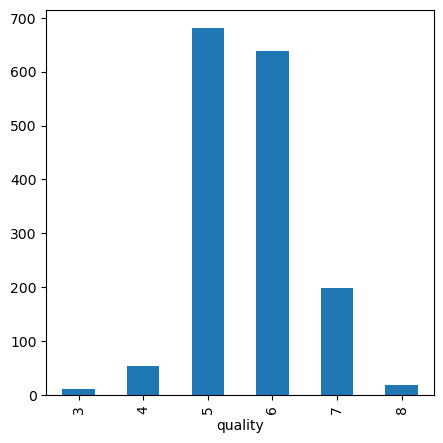

In [11]:
plt.figure(figsize=(5,5))
data.groupby('quality').size().plot(kind='bar')

<a id="section26"></a>
## <font color="#004D7F">2.6. Correlaciones: _corr()_ </font>

Puede usar la función `corr()` para calcular una matriz de correlación. La matriz enumera todos los atributos en la parte superior y lateral, para dar correlación entre todos los pares de atributos (dos veces, porque la matriz es simétrica). Puede ver que la línea diagonal a través de la matriz desde las esquinas superior izquierda a inferior derecha de la matriz muestra una correlación perfecta de cada atributo consigo mismo.

                      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
fixed acidity                 1.000            -0.256        0.672           0.115      0.094   
volatile acidity             -0.256             1.000       -0.552           0.002      0.061   
citric acid                   0.672            -0.552        1.000           0.144      0.204   
residual sugar                0.115             0.002        0.144           1.000      0.056   
chlorides                     0.094             0.061        0.204           0.056      1.000   
free sulfur dioxide          -0.154            -0.011       -0.061           0.187      0.006   
total sulfur dioxide         -0.113             0.076        0.036           0.203      0.047   
density                       0.668             0.022        0.365           0.355      0.201   
pH                           -0.683             0.235       -0.542          -0.086     -0.265   
sulphates                     

<function matplotlib.pyplot.show(close=None, block=None)>

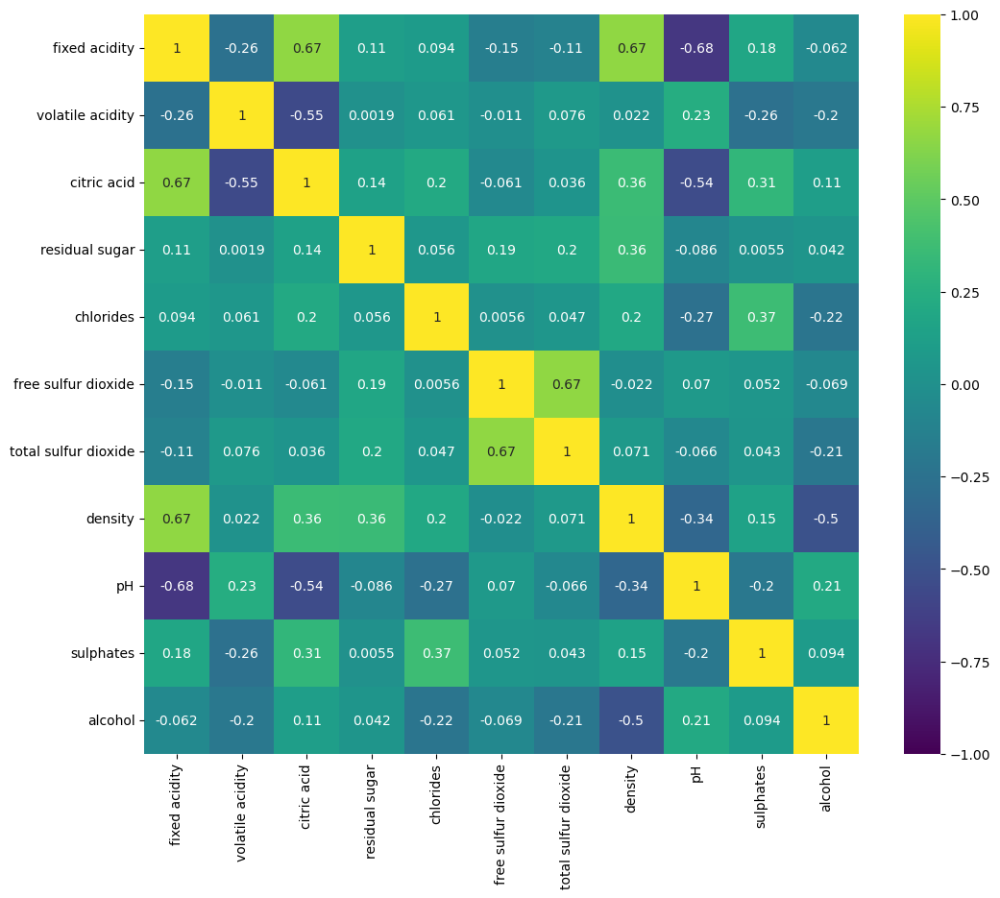

In [12]:
# Pairwise Pearson correlations
plt.figure(figsize=(12,10))
correlation=data.corr(method='pearson')
print(correlation)
sns.heatmap(correlation, vmin=-1,vmax=1,annot=True, cmap='viridis')
plt.show

In [13]:
coor_matrix=correlation.abs()
upper=coor_matrix.where(np.triu(np.ones(coor_matrix.shape),k=1).astype(bool))
# Find index of feature columns with correlation greater than 0.65
to_drop = [column for column in upper.columns if any(upper[column]>0.65)]
print(f'Columnas con correlación alta:{to_drop}')

Columnas con correlación alta:['citric acid', 'total sulfur dioxide', 'density', 'pH']


<a id="section27"></a>
## <font color="#004D7F">2.7. Asimetría: _skew()_ </font>

Puede calcular el sesgo de cada atributo utilizando la función `skew()`. El resultado de inclinación muestra una inclinación positiva (derecha) o negativa (izquierda). Los valores más cercanos a cero muestran menos sesgo.

In [14]:
# Skew for each attribute
data.skew(numeric_only=True)

fixed acidity           0.983
volatile acidity        0.672
citric acid             0.318
residual sugar          4.541
chlorides               5.680
free sulfur dioxide     1.251
total sulfur dioxide    1.516
density                 0.071
pH                      0.194
sulphates               2.429
alcohol                 0.861
dtype: float64

<a id="section28"></a>
## <font color="#004D7F">2.8. Histogramas </font>

<AxesSubplot:xlabel='alcohol', ylabel='Count'>

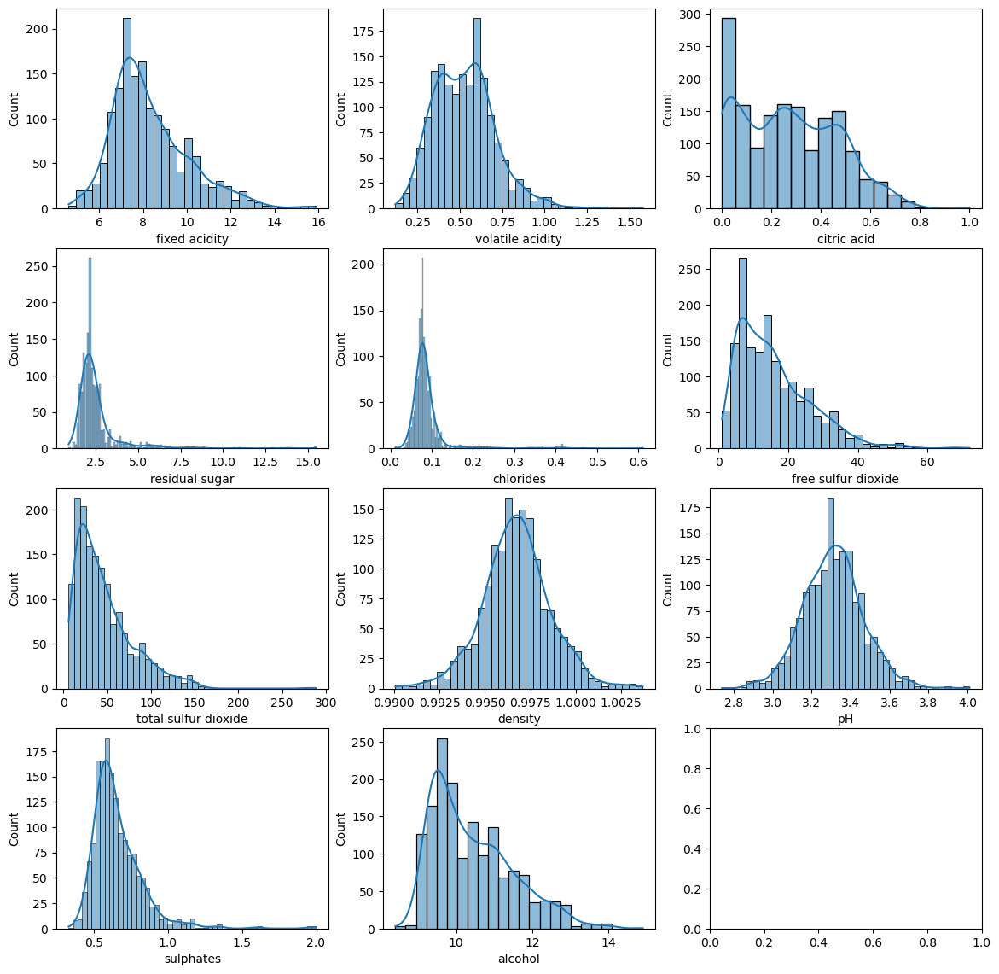

In [15]:
f , axes = plt.subplots(4,3,figsize=(14,14))
sns.histplot(data['fixed acidity'],kde=True,ax=axes[0,0])
sns.histplot(data['volatile acidity'],kde=True,ax=axes[0,1])
sns.histplot(data['citric acid'],kde=True,ax=axes[0,2])
sns.histplot(data['residual sugar'],kde=True,ax=axes[1,0])
sns.histplot(data['chlorides'],kde=True,ax=axes[1,1])
sns.histplot(data['free sulfur dioxide'],kde=True,ax=axes[1,2])
sns.histplot(data['total sulfur dioxide'],kde=True,ax=axes[2,0])
sns.histplot(data['density'],kde=True,ax=axes[2,1])
sns.histplot(data['pH'],kde=True,ax=axes[2,2])
sns.histplot(data['sulphates'],kde=True,ax=axes[3,0])
sns.histplot(data['alcohol'],kde=True,ax=axes[3,1])

## <font color="#004D7F">2.9.  Matriz de dispersion por clase </font>

<Figure size 3000x3000 with 0 Axes>

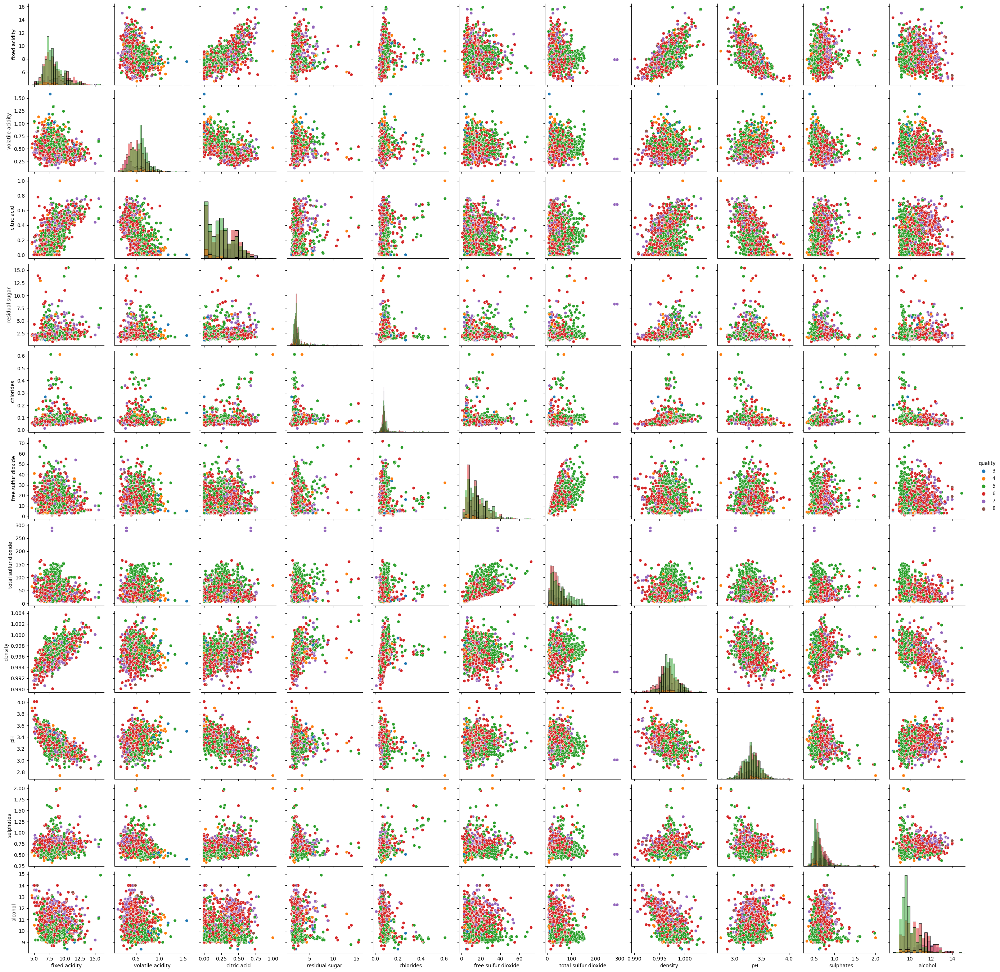

In [16]:
plt.figure(figsize=(30,30))
# Correlatioin matrix Seaborn
sns.pairplot(data,hue="quality",diag_kind="hist")
plt.show()

 ## <font color="#004D7F">2.10. BoxPlots </font>

C:\Users\andre\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


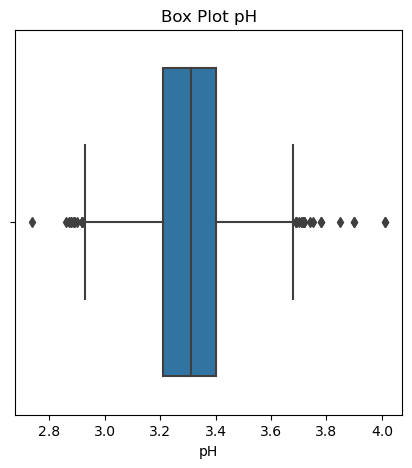

In [17]:
plt.figure(figsize=(5,5))
plt.title('Box Plot pH')
sns.boxplot(data["pH"])
plt.show()


<a id="section3"></a>
# <font color="#004D7F"> 3. Primer Clasificador</font>

El objetivo es construir un clasificar para una unica clase, por esta razon se van a agrupar las diferentes clases en 2 asumiendo que si el vino tiene una calidad superior a 6 es un buen vino de lo contrario es un vino de baja calidad

## <font color="#004D7F">  Explicar el paradigma del Machine Learning </font>

Presentar el Algortimo como un sistema que nos permite predecir una variable o un comportamiento, gracias a un proceso de entrenamiento 

In [18]:
data['quality']=data['quality'].astype('int64')
data['class']=data['quality']>6
data['class']=data['class'].astype('int64')
data.head(5)

df=data.drop('quality',inplace=False,axis=1)
df=data.drop('quality',inplace=False,axis=1)


## <font color="#004D7F"> Revisar Rapidamente los datos agrupados por esta nueva clase </font>

<Figure size 3000x3000 with 0 Axes>

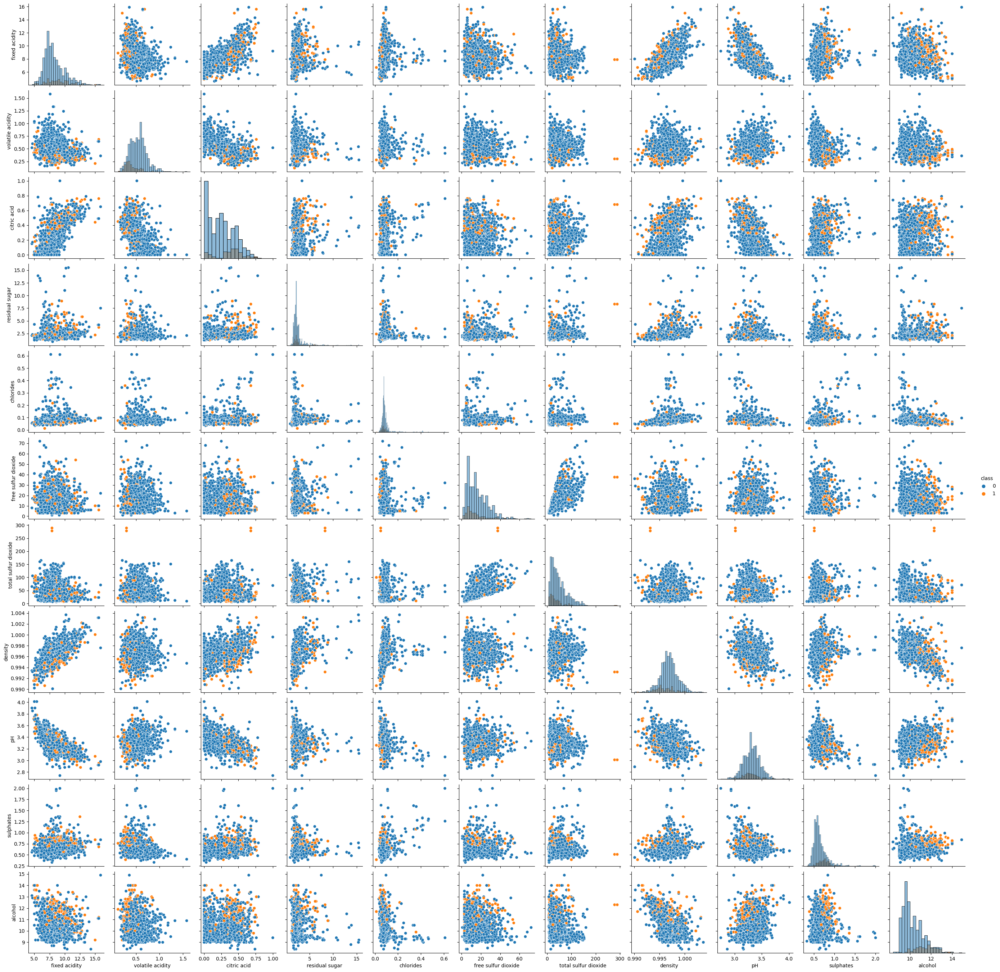

In [19]:
plt.figure(figsize=(30,30))
# Correlatioin matrix Seaborn
sns.pairplot(df,hue="class",diag_kind="hist")
plt.show()

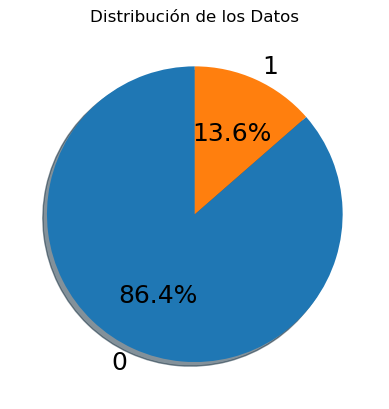

La Base de Datos Tiene: 11 Caracteristicas
La Base de Datos Tiene: 1599 Instancias de Datos
La Base de Datos Tiene: 1382 Instancias de la Clase 0
La Base de Datos Tiene: 217 Instancias de la Clase 1


In [20]:
unique_elements,count_elements =np.unique(df['class'],return_counts=True)

fig1 , ax1 = plt.subplots()
plt.title('Distribución de los Datos')
ax1.pie(count_elements, labels=unique_elements, autopct='%1.1f%%', 
        shadow=True, startangle=90, textprops={'fontsize':18})
plt.show()
      
print(f'La Base de Datos Tiene: {df.shape[1]-1} Caracteristicas')
print(f'La Base de Datos Tiene: {df.shape[0]} Instancias de Datos')
print(f'La Base de Datos Tiene: {count_elements[0]} Instancias de la Clase {unique_elements[0]}')
print(f'La Base de Datos Tiene: {count_elements[1]} Instancias de la Clase {unique_elements[1]}')      



## <font color="#004D7F"> Separación en Train y Test  </font>

In [21]:
from sklearn.model_selection import train_test_split

X=df.drop('class',axis=1) ## Elimina la Variable a Predecir 
y=df['class']

X_train, X_test , y_train, y_test = train_test_split(X,y,test_size=0.3, random_state=4, stratify=y)


### <font color="#004D7F"> Explorar la Composición de las Bases </font>

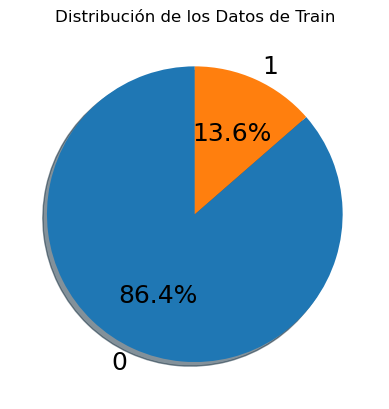

La Base de Datos Tiene: 11 Caracteristicas
La Base de Datos Tiene: 1119 Instancias de Datos
La Base de Datos Tiene: 967 Instancias de la Clase 0
La Base de Datos Tiene: 152 Instancias de la Clase 1


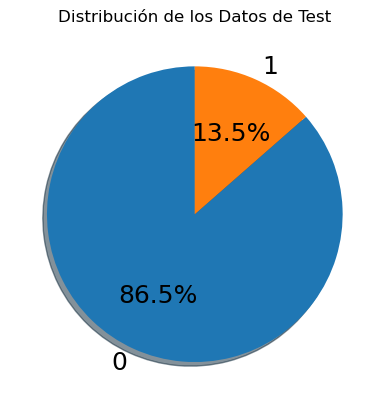

La Base de Datos Tiene: 11 Caracteristicas
La Base de Datos Tiene: 480 Instancias de Datos
La Base de Datos Tiene: 415 Instancias de la Clase 0
La Base de Datos Tiene: 65 Instancias de la Clase 1


In [22]:
unique_elements,count_elements =np.unique(y_train,return_counts=True)

fig1 , ax1 = plt.subplots()
plt.title('Distribución de los Datos de Train')
ax1.pie(count_elements, labels=unique_elements, autopct='%1.1f%%', 
        shadow=True, startangle=90, textprops={'fontsize':18})
plt.show()
      
print(f'La Base de Datos Tiene: {X_train.shape[1]} Caracteristicas')
print(f'La Base de Datos Tiene: {X_train.shape[0]} Instancias de Datos')
print(f'La Base de Datos Tiene: {count_elements[0]} Instancias de la Clase {unique_elements[0]}')
print(f'La Base de Datos Tiene: {count_elements[1]} Instancias de la Clase {unique_elements[1]}')      

unique_elements,count_elements =np.unique(y_test,return_counts=True)

fig1 , ax1 = plt.subplots()
plt.title('Distribución de los Datos de Test')
ax1.pie(count_elements, labels=unique_elements, autopct='%1.1f%%', 
        shadow=True, startangle=90, textprops={'fontsize':18})
plt.show()
      
print(f'La Base de Datos Tiene: {X_test.shape[1]} Caracteristicas')
print(f'La Base de Datos Tiene: {X_test.shape[0]} Instancias de Datos')
print(f'La Base de Datos Tiene: {count_elements[0]} Instancias de la Clase {unique_elements[0]}')
print(f'La Base de Datos Tiene: {count_elements[1]} Instancias de la Clase {unique_elements[1]}')      

In [23]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1119 entries, 1226 to 169
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1119 non-null   float64
 1   volatile acidity      1119 non-null   float64
 2   citric acid           1119 non-null   float64
 3   residual sugar        1119 non-null   float64
 4   chlorides             1119 non-null   float64
 5   free sulfur dioxide   1119 non-null   float64
 6   total sulfur dioxide  1119 non-null   float64
 7   density               1119 non-null   float64
 8   pH                    1119 non-null   float64
 9   sulphates             1119 non-null   float64
 10  alcohol               1119 non-null   float64
dtypes: float64(11)
memory usage: 104.9 KB


## <font color="#004D7F"> Maquinas de Soporte Vectorial  </font>

Invitar a ver el video de maquinas de soporte vectorial en youtube https://youtu.be/1T9Nnk_DIgw,

## <font color="#004D7F"> Escalización de los Datos   </font> 

<AxesSubplot:xlabel='alcohol', ylabel='Count'>

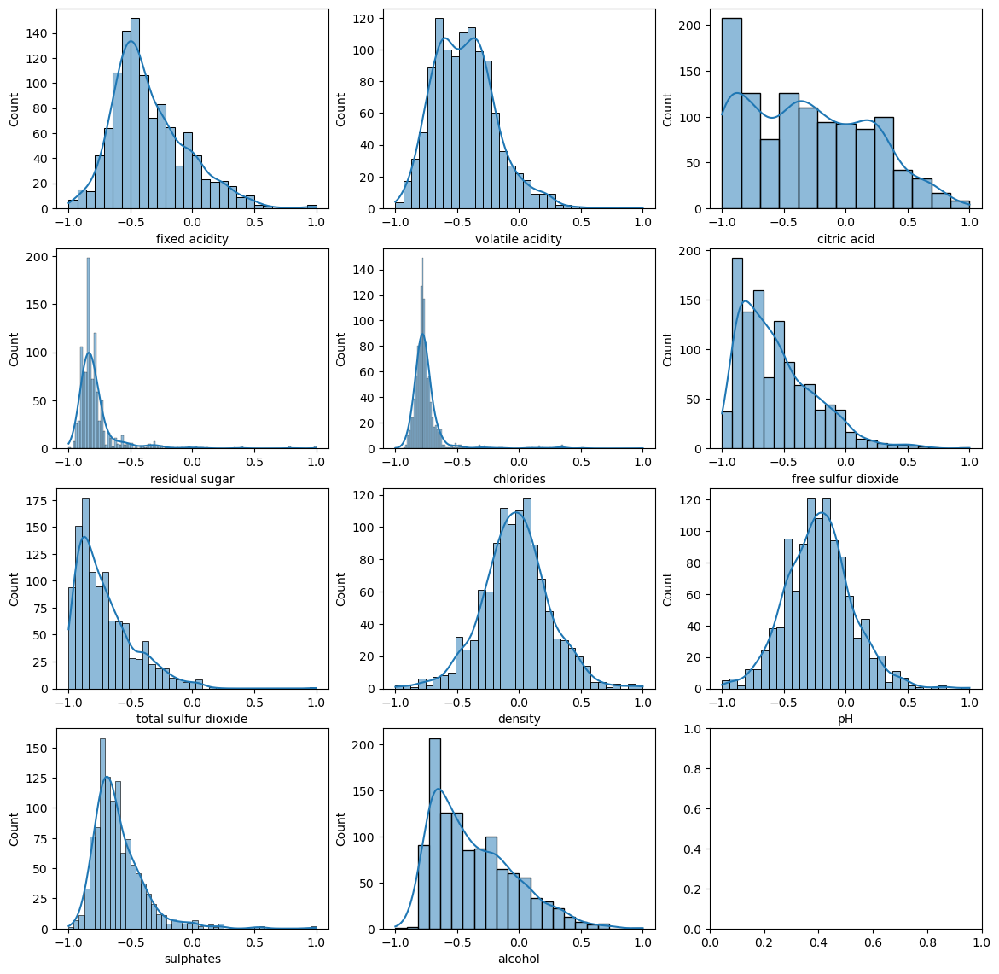

In [24]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler(feature_range=[-1,1]) 

X_trainS=scaler.fit_transform(X_train)
X_trainDF=pd.DataFrame(X_trainS,columns=X_train.columns)
f , axes = plt.subplots(4,3,figsize=(14,14))
sns.histplot(X_trainDF['fixed acidity'],kde=True,ax=axes[0,0])
sns.histplot(X_trainDF['volatile acidity'],kde=True,ax=axes[0,1])
sns.histplot(X_trainDF['citric acid'],kde=True,ax=axes[0,2])
sns.histplot(X_trainDF['residual sugar'],kde=True,ax=axes[1,0])
sns.histplot(X_trainDF['chlorides'],kde=True,ax=axes[1,1])
sns.histplot(X_trainDF['free sulfur dioxide'],kde=True,ax=axes[1,2])
sns.histplot(X_trainDF['total sulfur dioxide'],kde=True,ax=axes[2,0])
sns.histplot(X_trainDF['density'],kde=True,ax=axes[2,1])
sns.histplot(X_trainDF['pH'],kde=True,ax=axes[2,2])
sns.histplot(X_trainDF['sulphates'],kde=True,ax=axes[3,0])
sns.histplot(X_trainDF['alcohol'],kde=True,ax=axes[3,1])

In [25]:
from sklearn.svm import SVC

clf=SVC(kernel='rbf',probability=True)
clf.fit(X_trainS,y_train)

## Predice usando todos los datos de train
y_pred_prob=clf.predict_proba(X_trainS)[:,1]
class_threshold=0.64
y_pred_train=(y_pred_prob>class_threshold)



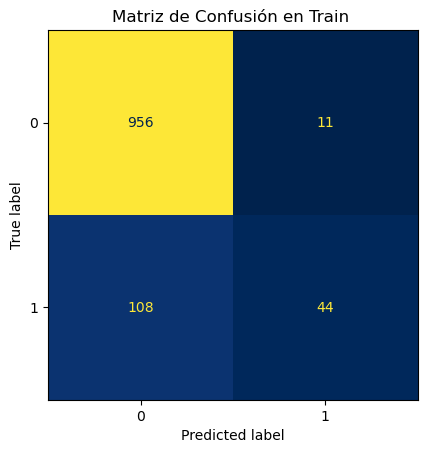

La Base de Datos Tiene: 11 Caracteristicas
La Base de Datos Tiene: 1119 Instancias de Datos
La Base de Datos Tiene: 967 Instancias de la Clase 0
La Base de Datos Tiene: 152 Instancias de la Clase 1
El clasificador tiene un Accuracy de :89.37% en Train
El clasificador tiene una Presición de :80.00% en Train
El clasificador tiene un Recall de :28.95% en Train


In [26]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_train, y_pred_train, labels=clf.classes_)
disp = ConfusionMatrixDisplay( confusion_matrix=cm,display_labels=clf.classes_)
disp.plot(values_format='d',cmap='cividis', colorbar=False)
plt.title('Matriz de Confusión en Train ')
plt.show()
unique_elements,count_elements =np.unique(y_train,return_counts=True)
print(f'La Base de Datos Tiene: {X_trainS.shape[1]} Caracteristicas')
print(f'La Base de Datos Tiene: {X_trainS.shape[0]} Instancias de Datos')
print(f'La Base de Datos Tiene: {count_elements[0]} Instancias de la Clase {unique_elements[0]}')
print(f'La Base de Datos Tiene: {count_elements[1]} Instancias de la Clase {unique_elements[1]}')    
print(f'El clasificador tiene un Accuracy de :{accuracy_score(y_train, y_pred_train)*100.0:,.2f}% en Train')
print(f'El clasificador tiene una Presición de :{precision_score(y_train, y_pred_train)*100.0:,.2f}% en Train')
print(f'El clasificador tiene un Recall de :{recall_score(y_train, y_pred_train)*100.0:,.2f}% en Train')


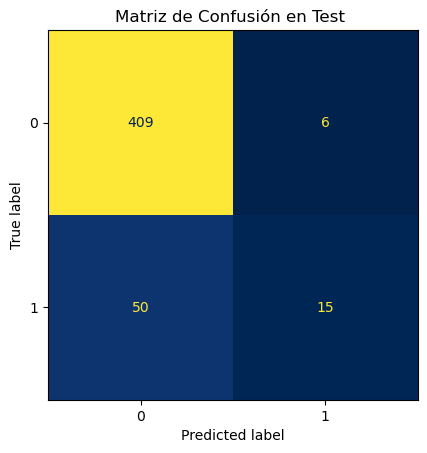

La Base de Datos Tiene: 11 Caracteristicas
La Base de Datos Tiene: 480 Instancias de Datos
La Base de Datos Tiene: 415 Instancias de la Clase 0
La Base de Datos Tiene: 65 Instancias de la Clase 1
El clasificador tiene un Accuracy de :88.33% en Train
El clasificador tiene una Presición de :71.43% en Train
El clasificador tiene un Recall de :23.08% en Train


In [27]:
## Hay que escalar la base de test
X_testS=scaler.transform(X_test)

## Predice usando todos los datos de test
y_pred_prob=clf.predict_proba(X_testS)[:,1]
y_pred_test=(y_pred_prob>class_threshold)

cm = confusion_matrix(y_test, y_pred_test, labels=clf.classes_)
disp = ConfusionMatrixDisplay( confusion_matrix=cm,display_labels=clf.classes_)
disp.plot(values_format='d',cmap='cividis', colorbar=False)
plt.title('Matriz de Confusión en Test ')
plt.show()

unique_elements,count_elements =np.unique(y_test,return_counts=True)
print(f'La Base de Datos Tiene: {X_testS.shape[1]} Caracteristicas')
print(f'La Base de Datos Tiene: {X_testS.shape[0]} Instancias de Datos')
print(f'La Base de Datos Tiene: {count_elements[0]} Instancias de la Clase {unique_elements[0]}')
print(f'La Base de Datos Tiene: {count_elements[1]} Instancias de la Clase {unique_elements[1]}')
print(f'El clasificador tiene un Accuracy de :{accuracy_score(y_test, y_pred_test)*100.0:,.2f}% en Train')
print(f'El clasificador tiene una Presición de :{precision_score(y_test, y_pred_test)*100.0:,.2f}% en Train')
print(f'El clasificador tiene un Recall de :{recall_score(y_test, y_pred_test)*100.0:,.2f}% en Train')

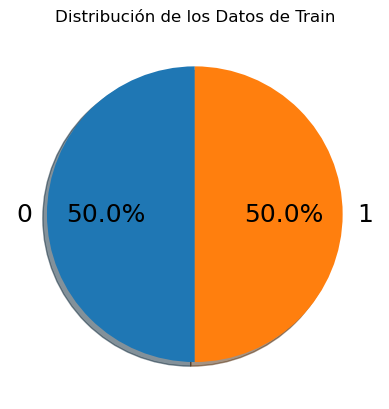

La Base de Datos Tiene: 11 Caracteristicas
La Base de Datos Tiene: 1934 Instancias de Datos
La Base de Datos Tiene: 967 Instancias de la Clase 0
La Base de Datos Tiene: 967 Instancias de la Clase 1


In [28]:
from imblearn.over_sampling import RandomOverSampler

ros= RandomOverSampler(sampling_strategy=1.0, random_state=87)

X_train_OS, y_train_OS = ros.fit_resample(X_trainS,y_train)

unique_elements,count_elements =np.unique(y_train_OS,return_counts=True)

fig1 , ax1 = plt.subplots()
plt.title('Distribución de los Datos de Train')
ax1.pie(count_elements, labels=unique_elements, autopct='%1.1f%%', 
        shadow=True, startangle=90, textprops={'fontsize':18})
plt.show()
      
print(f'La Base de Datos Tiene: {X_train_OS.shape[1]} Caracteristicas')
print(f'La Base de Datos Tiene: {X_train_OS.shape[0]} Instancias de Datos')
print(f'La Base de Datos Tiene: {count_elements[0]} Instancias de la Clase {unique_elements[0]}')
print(f'La Base de Datos Tiene: {count_elements[1]} Instancias de la Clase {unique_elements[1]}')  


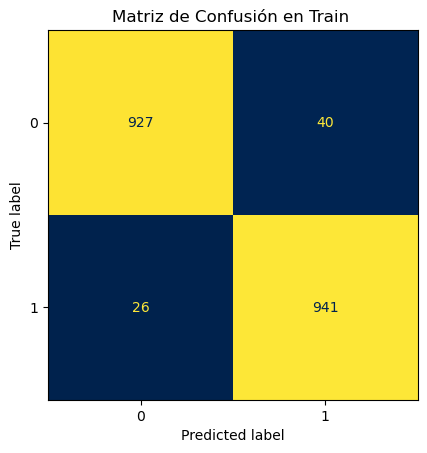

La Base de Datos Tiene: 11 Caracteristicas
La Base de Datos Tiene: 1934 Instancias de Datos
La Base de Datos Tiene: 967 Instancias de la Clase 0
La Base de Datos Tiene: 967 Instancias de la Clase 1
El clasificador tiene un Accuracy de :96.59% en Train
El clasificador tiene una Presición de :95.92% en Train
El clasificador tiene un Recall de :97.31% en Train


In [29]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

clf=SVC(kernel='rbf',C=48.74506884566138,probability=True)
clf.fit(X_train_OS,y_train_OS)

## Predice usando todos los datos de train
y_pred_prob=clf.predict_proba(X_train_OS)[:,1]
class_threshold=0.64
y_pred_train=(y_pred_prob>class_threshold)


from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_train_OS, y_pred_train, labels=clf.classes_)
disp = ConfusionMatrixDisplay( confusion_matrix=cm,display_labels=clf.classes_)
disp.plot(values_format='d',cmap='cividis', colorbar=False)
plt.title('Matriz de Confusión en Train ')
plt.show()
unique_elements,count_elements =np.unique(y_train_OS,return_counts=True)
print(f'La Base de Datos Tiene: {X_train_OS.shape[1]} Caracteristicas')
print(f'La Base de Datos Tiene: {X_train_OS.shape[0]} Instancias de Datos')
print(f'La Base de Datos Tiene: {count_elements[0]} Instancias de la Clase {unique_elements[0]}')
print(f'La Base de Datos Tiene: {count_elements[1]} Instancias de la Clase {unique_elements[1]}') 
print(f'El clasificador tiene un Accuracy de :{accuracy_score(y_train_OS, y_pred_train)*100.0:,.2f}% en Train')
print(f'El clasificador tiene una Presición de :{precision_score(y_train_OS, y_pred_train)*100.0:,.2f}% en Train')
print(f'El clasificador tiene un Recall de :{recall_score(y_train_OS, y_pred_train)*100.0:,.2f}% en Train')



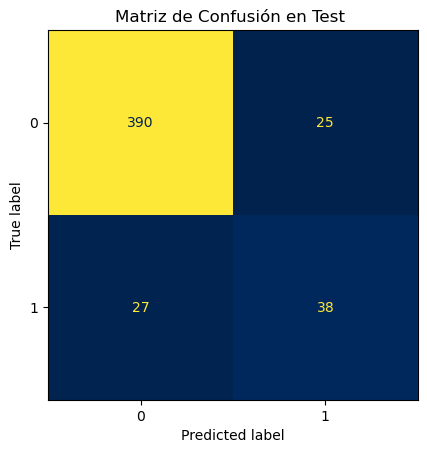

La Base de Datos Tiene: 11 Caracteristicas
La Base de Datos Tiene: 480 Instancias de Datos
La Base de Datos Tiene: 415 Instancias de la Clase 0
La Base de Datos Tiene: 65 Instancias de la Clase 1
El clasificador tiene un Accuracy de :89.17% en Test
El clasificador tiene una Presición de :60.32% en Test
El clasificador tiene un Recall de :58.46% en Test


In [30]:
## Predice usando todos los datos de test
y_pred_prob=clf.predict_proba(X_testS)[:,1]
y_pred_test=(y_pred_prob>class_threshold)

cm = confusion_matrix(y_test, y_pred_test, labels=clf.classes_)
disp = ConfusionMatrixDisplay( confusion_matrix=cm,display_labels=clf.classes_)
disp.plot(values_format='d',cmap='cividis', colorbar=False)
plt.title('Matriz de Confusión en Test ')
plt.show()

unique_elements,count_elements =np.unique(y_test,return_counts=True)
print(f'La Base de Datos Tiene: {X_testS.shape[1]} Caracteristicas')
print(f'La Base de Datos Tiene: {X_testS.shape[0]} Instancias de Datos')
print(f'La Base de Datos Tiene: {count_elements[0]} Instancias de la Clase {unique_elements[0]}')
print(f'La Base de Datos Tiene: {count_elements[1]} Instancias de la Clase {unique_elements[1]}')
print(f'El clasificador tiene un Accuracy de :{accuracy_score(y_test, y_pred_test)*100.0:,.2f}% en Test')
print(f'El clasificador tiene una Presición de :{precision_score(y_test, y_pred_test)*100.0:,.2f}% en Test')
print(f'El clasificador tiene un Recall de :{recall_score(y_test, y_pred_test)*100.0:,.2f}% en Test')


In [31]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
kfold= KFold(n_splits=10, random_state=39,shuffle=True)
scoring='accuracy'
results=cross_val_score(clf,X_train_OS,y_train_OS,cv=kfold,scoring=scoring)
print(f'El accuracy es : {results.mean()*100.0:,.2f} % ({results.std()*100.0:,.2f}%)')
scoring='precision'
results=cross_val_score(clf,X_train_OS,y_train_OS,cv=kfold,scoring=scoring)
print(f'La precision es : {results.mean()*100.0:,.2f} % ({results.std()*100.0:,.2f}%)')
scoring='recall'
results=cross_val_score(clf,X_train_OS,y_train_OS,cv=kfold,scoring=scoring)
print(f'El recall es : {results.mean()*100.0:,.2f} % ({results.std()*100.0:,.2f}%)')

El accuracy es : 93.02 % (1.89%)
La precision es : 89.32 % (3.21%)
El recall es : 97.75 % (2.12%)


In [32]:
results

array([0.98058252, 0.94565217, 0.94845361, 0.94897959, 1.        ,
       0.97272727, 1.        , 0.98913043, 0.98913043, 1.        ])

In [33]:
# Grid Search for Algorithm Tuning
from sklearn.model_selection import GridSearchCV

c= np.array([77,78,79])

kernel = np.array(['poly','linear','rbf'])

param_grid = dict(C=c,kernel =kernel)

model=SVC()

grid=GridSearchCV(estimator=model,scoring='precision', param_grid=param_grid, cv=5)
grid.fit(X_train_OS,y_train_OS)

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': array([77, 78, 79]),
                         'kernel': array(['poly', 'linear', 'rbf'], dtype='<U6')},
             scoring='precision')

In [34]:
print(f'Best precision: {grid.best_score_.mean()*100.0:,.2f}')
print(f'Best Cost (C) : {grid.best_estimator_.C}')
print(f'Best Kernel : {grid.best_estimator_.kernel}')

Best precision: 89.87
Best Cost (C) : 78
Best Kernel : rbf


In [35]:
from scipy.stats  import uniform 
from sklearn.model_selection import RandomizedSearchCV

param_random = {'C': uniform(1,50)}

model=SVC()

rsearch=RandomizedSearchCV(estimator=clf,scoring='precision',param_distributions=param_random,n_iter=50,random_state=87,cv=5)
rsearch.fit(X_train_OS,y_train_OS)
print(f'La Mejor Presicion es : {rsearch.best_score_.mean()*100.0:,.2f}%')
print(f'El mejor C para esta Presicion es {rsearch.best_estimator_.C}')


La Mejor Presicion es : 89.27%
El mejor C para esta Presicion es 48.74506884566138


In [36]:
rsearch.cv_results_

{'mean_fit_time': array([0.53603811, 0.57104201, 0.48383427, 0.45703292, 0.45263186,
        0.53083811, 0.47823396, 0.50243583, 0.47423387, 0.49263439,
        0.48423462, 0.45122914, 0.43802915, 0.46403232, 0.42902827,
        0.4488318 , 0.42062984, 0.43983121, 0.53523803, 0.4702332 ,
        0.46543317, 0.44323001, 0.43123083, 0.41502948, 0.5028348 ,
        0.4368289 , 0.44323139, 0.53763776, 0.42763047, 0.45243211,
        0.49783621, 0.52303648, 0.48463387, 0.53503885, 0.51223612,
        0.42503033, 0.48723392, 0.50203671, 0.47703257, 0.53343797,
        0.49523559, 0.44163203, 0.44423137, 0.44823241, 0.47463341,
        0.52623711, 0.47343349, 0.45783262, 0.55963988, 0.50743489]),
 'std_fit_time': array([0.085872  , 0.06645982, 0.02621165, 0.07288315, 0.02706925,
        0.01841202, 0.03754458, 0.033664  , 0.0304155 , 0.02648598,
        0.0298236 , 0.02521665, 0.01519125, 0.04589061, 0.01537829,
        0.00762694, 0.01974593, 0.03144375, 0.02946112, 0.0174185 ,
        0.020